In [1]:
# Adding the neccecary imports to our code
import pydot # conda install pydot
import time
from data_structures import Edge,Vertex,Graph,create_custom_graph

In [2]:
#type of data:
url_Les_Miserables_network  = '../data/LesMiserables.dot'
url_Rome_graph  = '../data/rome.dot'
url_Jazz_Network  = '../data/JazzNetwork.dot'
url_Small_Directed_Network  = '../data/noname.dot'
url_Pro_League_Network  = '../data/LeagueNetwork.dot'
url_Argumentation_network  = '../data/devonshiredebate_withclusters.dot'
url_Argumentation_network_for_part_five = '../data/devonshiredebate_withonlytwoclusters.dot'
url_Political_blogosphere_network  = '../data/polblogs.dot'


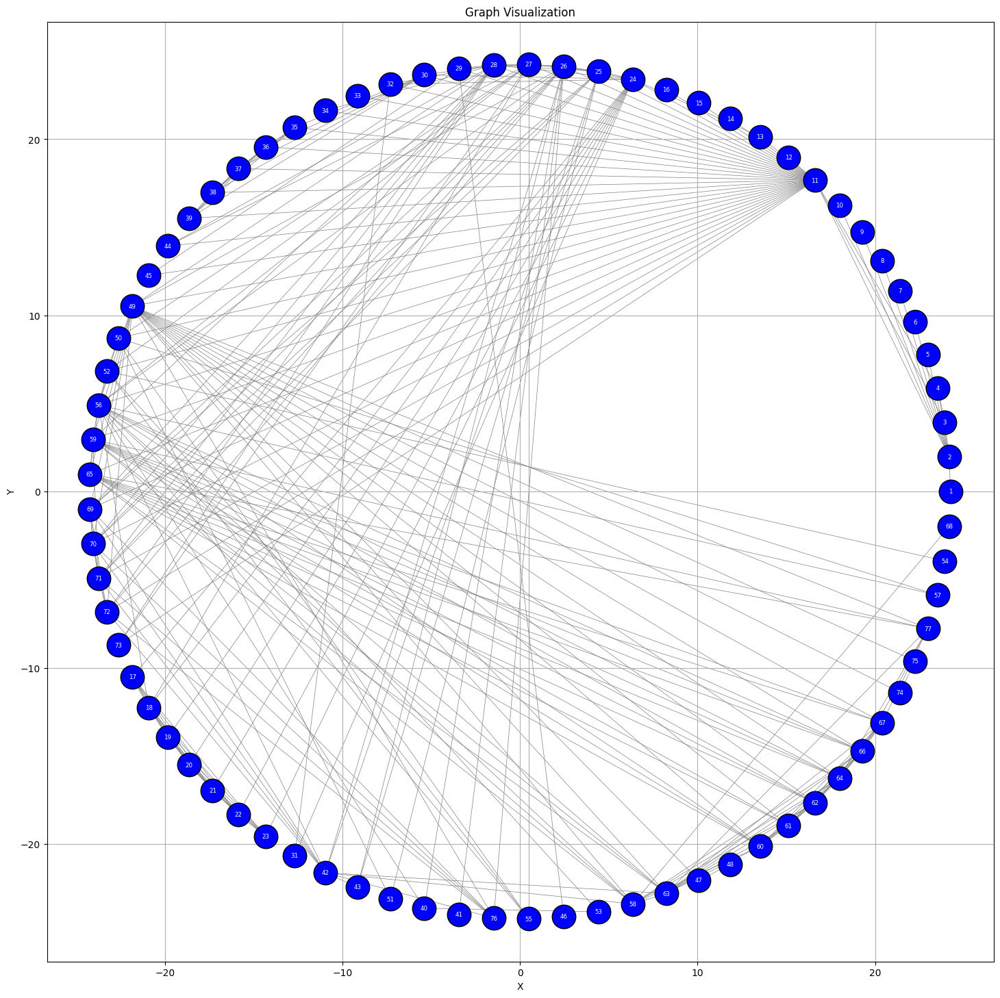

In [3]:
# Parsing the data from the dot file:
G = pydot.graph_from_dot_file(url_Les_Miserables_network)[0]
#Convering the graph into our custom graph
graph = create_custom_graph(G) #O(V) + O(E) = O(V + E)
# Visualize the graph
fig_size=5+len(graph.vertices)/6 # new line
radius=5+len(graph.vertices)/4 # new line
graph.visualize_graph(fig_size,radius) #O(V + E)

avg neighbors 13.848484848484848


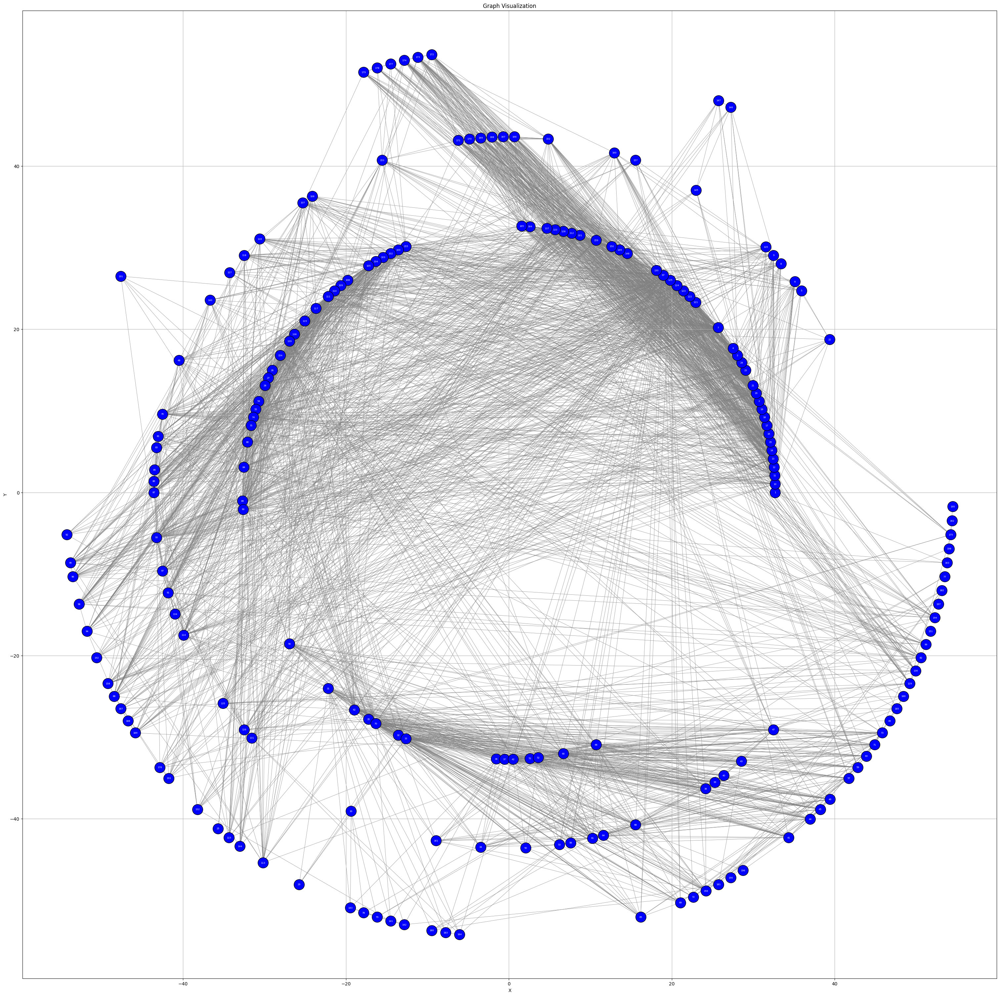

Runtime: 8.974691152572632 seconds


In [4]:
# Run Bonus part

start_time = time.time()
# Parsing the data from the dot file:
G = pydot.graph_from_dot_file(url_Jazz_Network)[0]
#Convering the graph into our custom graph
graph = create_custom_graph(G) #O(V) + O(E) = O(V + E)
# Visualize the graph
fig_size=5+len(graph.vertices)/6 # new line
radius=5+len(graph.vertices)/4 # new line
graph.visualize_graph_Bonus(fig_size,radius) #O(V + E) #O(V + E)

end_time = time.time()
runtime = end_time - start_time
print("Runtime:", runtime, "seconds")

# Complexity of our layout algorithm:
First, we converted the dot file into a graph representation. To work effectively with this graph, we designed a custom structure that is more suitable for our requirements, by using the function "create_custom_graph" that takes the generated graph and converts it into our graph.
Subsequently, our algorithm proceeds as follows:
We iterate through all vertices of the graph and plot them in a circular format. This process has a time complexity of $O(V)$.
Next, we scan through the edges of the graph. For each edge, we draw a line between the corresponding pair of vertices. This step has a time complexity of $O(E)$ since it involves iterating over all edges.

Therefore, the total **time complexity** of our layout algorithm is **$O(V + E)$**, where V represents the number of vertices and E represents the number of edges in the graph.

In addition, the **space complexity** is **$ O(V^2 + E) $**:
* The class "Edge" is $O(1)$, because it only contains simple variables.
* The class "Vertex" is $O(V)$, because it contains a list of vertices, which in the worst case can contain as many vertices as the total
  vertices - 1. Which is $O(V)$, where V denotes the number of vertices in the graph.
* The class "Graph" is $ O(V^2 + E) $ because we have 2 lists, the first list contains all the vertices ( = $ O(V*V) = O(V^2) $ ) and the second list contains all the edges ( =$O(E)$), therefore, the total space complexity is $ O(V^2 + E) $, where V represents the number of vertices and E represents the number of edges in the graph.

The total space complexity is $ O(V^2 + E + V + E) = O(V^2 + E) $

# Pro's and Con's
### Pro's:
* Our algorithm performs well in small and medium size datasets (e.g. noname.dot, LeagueNetwork.dot), by visualizing the graph in a circular structure.
* Our algorithm has fewer overlapping vertices (e.g JazzNetwork.dot), we achieved that by making the distance between the vertices equal, with respect to the overall number of vertices.
* Our algorithm is very fast and efficient, with time complexity of **$O(V+E)$** and space complexity of **$O(V^2+E)$**

### Con's
* Our algorithm has a problem with large datasets visualization (e.g. polblogs.dot), since large datasets contain a lot of vertices and edges which makes the graph unreadable.
*
Our algorithm struggles to represent long strings understandably. For example, the graph from polblogs.dot has words instead of numbers as the ID of each vertex. To address this, we need to adjust the shape and size of the vertices accordingly, which leads to overlapping between the vertices.

Unfortunately, our algorithm cannot handle the visualization and management of those cons in a readable and clean way.




# Bonus Part

In this part, we took the original layout of the vertex placement and adjusted it to make an improved visualized graph with clearer and more informative results, especially for large datasets (e.g. JazzNetwork.dot). We've done so by adding layers into the calculation of the vertices' location to the original graph. Each layer contains vertices with a range of neighbors. The outer layer includes vertices with a number of vertices equal or fewer than the average number of neighbors divided by 3, the middle layer contains all the vertices with the number of neighbors between the average number of neighbors and the average number of neighbors divided by 3, and the inner layer includes all remaining vertices. We've done so because in our original layout (where all of the vertices are on the same layer = in the same distance from the center(0,0)) we couldn't (or it was very hard) distinguish between the nodes that have fewer neighbors than the ones that have more neighbors. We accomplished this by creating a new function called "place_vertices_in_circle_Bonus" in addition to placing the nodes into a circular shape also dividing them into layers (as explained above). In that function, we added a few "if" statements that helped us separate the nodes by neighbors by changing the radius (the distance from the center (0,0) according to the corresponding layer(as explained above).

As a result of changing the positions of the vertices (with the new function called "place_vertices_in_circle_Bonus") we got a better visualization than just using the original algorithm.
The new algorithm differs from the original algorithm by additional "if" statements that all of them are $O(1)$ (we are just assigning new value to a variable), therefore the time complexity did not change and stayed $O(V)$ where V denotes the number of vertices in the graph.

The running time for the bonus part on the JazzNetwork.dot file is 8.97 seconds

Additionally, to visualize the graph in this part we needed to calculate additional things(the average neighbors and the running time), we still needed to iterate through all of the vertices and edges, as in the original algorithm. The **time complexity** remains **$O(V + E)$** where V denotes the vertices and E denotes the edges in the graph. Although we created a new visualization function for the bonus part called "visualize_graph_Bonus", which involves computing the average and running time, we added one more loop with time complexity of $O(V)$.
However, since it is not nested within the other loops, its time complexity is $O(V+V+V+E) = O(3V+E) = O(V+E)$.

We didn't change any of our data structures therefore the **space complexity** didn't change either and stayed **$O( V^2 + E )$**.
